**Project 2 - Surface Defect Detection and Classification from Images**

Group Members:
1.   Muhammad Abdul Basit Farooqi (24100056)
2.   Ali Rehman (24100255) **bold text**



In [22]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [23]:
# you can add more libraries if you want. If confused whether you can use a paticular library consult one of the TAs
import numpy as np
import sklearn
import glob 
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

In [24]:
import cv2
import numpy as np
from skimage.feature import hog

def preprocessing(img):
    # Resize image to 150x150
    img = cv2.resize(img, (350, 350))

    # Convert image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # Define color range for paper with hole
    lower_hole = np.array([0, 0, 210])
    upper_hole = np.array([255, 50, 255])
    mask_hole = cv2.inRange(hsv, lower_hole, upper_hole)

    # Define color range for paper with pen marks
    lower_pen = np.array([0, 0, 0])
    upper_pen = np.array([255, 255, 100])
    mask_pen = cv2.inRange(hsv, lower_pen, upper_pen)

    # Define color range for paper with no defects
    lower_no_defects = np.array([0, 0, 210])
    upper_no_defects = np.array([255, 50, 255])
    mask_no_defects = cv2.inRange(hsv, lower_no_defects, upper_no_defects)

    # Combine masks
    mask = cv2.bitwise_or(mask_hole, mask_pen, mask_no_defects)

    # Apply mask to image
    masked_img = cv2.bitwise_and(img, img, mask=mask)

    # Compute spatial binning features
    spatial_size = (16, 16)
    spatial_features = cv2.resize(masked_img, spatial_size).ravel()

    # Compute color histogram features
    hist_bins = 32
    hist_range = (0, 256)
    hist_features = np.concatenate((
        cv2.calcHist([masked_img], [0], mask, [hist_bins], hist_range).ravel(),
        cv2.calcHist([masked_img], [1], mask, [hist_bins], hist_range).ravel(),
        cv2.calcHist([masked_img], [2], mask, [hist_bins], hist_range).ravel()
    ))

    # Compute HOG features
    hog_channel = 0
    hog_orientations = 9
    hog_pixels_per_cell = (8, 8)
    hog_cells_per_block = (2, 2)
    hog_features = hog(
        cv2.cvtColor(masked_img, cv2.COLOR_RGB2GRAY),
        orientations=hog_orientations,
        pixels_per_cell=hog_pixels_per_cell,
        cells_per_block=hog_cells_per_block,
        transform_sqrt=True,
        feature_vector=True,
        block_norm='L2-Hys'
    )

    # Concatenate features
    features = np.concatenate((spatial_features, hist_features, hog_features))

    return features


In [ ]:
# load your dataset here
import os
import cv2
import numpy as np


white_paper_path = "/content/gdrive/MyDrive/ml project/out/paper/"
hole_path = "/content/gdrive/MyDrive/ml project/out/hole/"
mark_path = "/content/gdrive/MyDrive/ml project/out/penMark/"

data = []  # Array to store features
labels = []  # Array to store labels

# Process images in fire folder
for filename in os.listdir(white_paper_path):
    if filename.endswith(".jpg"):
        img = cv2.imread(white_paper_path + filename)
        img_features = preprocessing(img)
        data.append(img_features)
        labels.append(0)


# Process images in not_fire folder
for filename in os.listdir(hole_path):
    if filename.endswith(".jpg"):
        img = cv2.imread(hole_path + filename)
        img_features = preprocessing(img)
        data.append(img_features)
        labels.append(1)

for filename in os.listdir(mark_path):
    if filename.endswith(".jpg"):
        img = cv2.imread(mark_path + filename)
        img_features = preprocessing(img)
        data.append(img_features)
        labels.append(2)


labels = np.array(labels)

#print(data)


In [27]:
matrix = np.array(data)
print(matrix.shape)
matrix = np.squeeze(matrix)
print(matrix.shape)

(1500, 64368)
(1500, 64368)


In [34]:
X_train, X_test, y_train, y_test = train_test_split(matrix,labels,random_state=42, train_size = 0.75)


In [66]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
results=[] #to store results

**Classfiers Applied along with their result**

Logistic Regression

In [70]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# Load the dataset

# Split the dataset into training and testing sets

# Create the logistic regression model
logreg = LogisticRegression(multi_class='multinomial', max_iter=7000)
# Reshape X_train and X_test


# Train the model on the training data
logreg.fit(X_train, y_train)

# Use the model to predict on the test data
y_pred = logreg.predict(X_test)

# Evaluate the model on the test data
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')


# Print the results
print("Accuracy:", accuracy*100)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
results.append(["Logistic Regression",accuracy*100,f1,precision,recall,conf_matrix])


Accuracy: 80.80000000000001
F1 Score: 0.8064568713091259
Confusion Matrix:
 [[107  17   2]
 [ 23  74  15]
 [  1  14 122]]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Neural Network(MLP)

In [74]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# Create the MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(350,), max_iter=2000, random_state=42)

# Train the model on the training data
mlp.fit(X_train, y_train)

# Use the model to predict on the test data
y_pred = mlp.predict(X_test)

# Evaluate the model on the test data
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

# Print the results
print("Accuracy:", accuracy*100)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
results.append(["Neural Network(MLP)",accuracy*100,f1,precision,recall,conf_matrix])

Accuracy: 74.4
F1 Score: 0.7398394227307843
Confusion Matrix:
 [[115  11   0]
 [ 49  56   7]
 [ 15  14 108]]


SVM

In [76]:
from sklearn import svm
# Initialize the SVM classifier
clf = svm.SVC(kernel='linear', C=15, random_state=0)

# Fit the classifier to the training data
clf.fit(X_train, y_train)

# Predict the labels of the test data
y_pred = clf.predict(X_test)

# Print the accuracy score of the classifier
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

# Print the results
print("Accuracy:", accuracy*100)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
results.append(["SVM Linear Kernal",accuracy*100,f1,precision,recall,conf_matrix])

Accuracy: 76.0
F1 Score: 0.7621281874287139
Confusion Matrix:
 [[ 98  24   4]
 [ 32  73   7]
 [  7  16 114]]


Naive Bayes

In [80]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# Fit the classifier to the training data
clf = GaussianNB()
clf.fit(X_train, y_train)

# Predict the labels of the test data
y_pred = clf.predict(X_test)

# Print the accuracy score of the classifier
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

# Print the results
print("Accuracy:", accuracy*100)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_matrix)
results.append(["Naive Bayes",accuracy*100,f1,precision,recall,conf_matrix])

Accuracy: 64.0
F1 Score: 0.6438088761566932
Confusion Matrix:
 [[93 33  0]
 [13 91  8]
 [ 1 80 56]]


In [98]:
results_df = pd.DataFrame(results, columns=['Classifier','Accuracy', 'F1-score','Precision','Recall', 'Confusion Matrix'])
print(results_df)

            Classifier  Accuracy  F1-score  Precision  Recall  \
0  Logistic Regression      80.8  0.806457   0.805584   0.808   
1  Neural Network(MLP)      74.4  0.739839   0.765447   0.744   
2    SVM Linear Kernal      76.0  0.762128   0.766478   0.760   
3          Naive Bayes      64.0  0.643809   0.744933   0.640   

                             Confusion Matrix  
0  [[107, 17, 2], [23, 74, 15], [1, 14, 122]]  
1  [[115, 11, 0], [49, 56, 7], [15, 14, 108]]  
2    [[98, 24, 4], [32, 73, 7], [7, 16, 114]]  
3     [[93, 33, 0], [13, 91, 8], [1, 80, 56]]  


Defect Detection:

In [95]:
import cv2

def defect_detection(img):
  ret, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
  contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

  from google.colab.patches import cv2_imshow
  # ...
  roi=[]
  # for contour in contours:
  largest_contour = []
  largest_area = 0
  for contour in contours:

    area = cv2.contourArea(contour)
    if area > largest_area:
        largest_area = area
        largest_contour = contour
  x,y,w,h = cv2.boundingRect(largest_contour)

  cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
  cv2_imshow(img)
  cv2.waitKey(0)
  cv2.destroyAllWindows()



Actula Label :  Pen Mark
Predicted label :  Pen Mark
Defect Detection : 


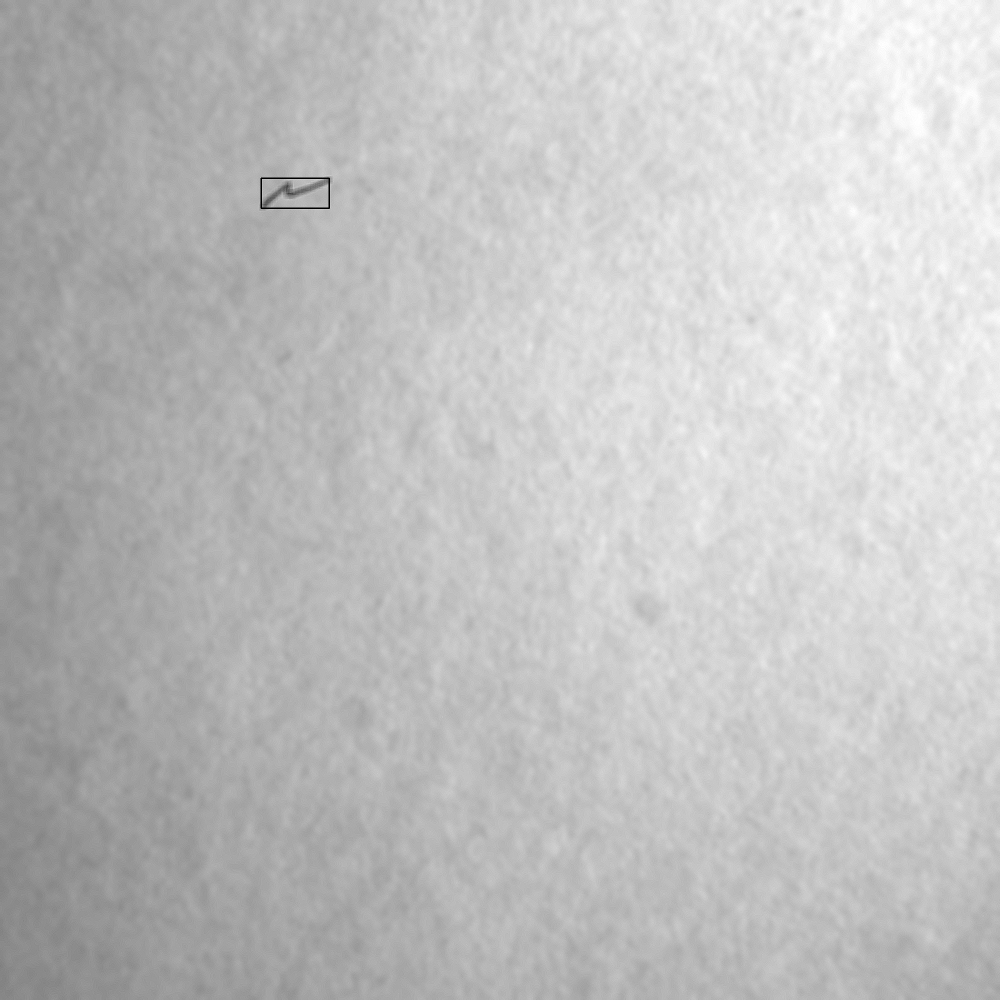

Actula Label :  Pen Mark
Predicted label :  Pen Mark
Defect Detection : 


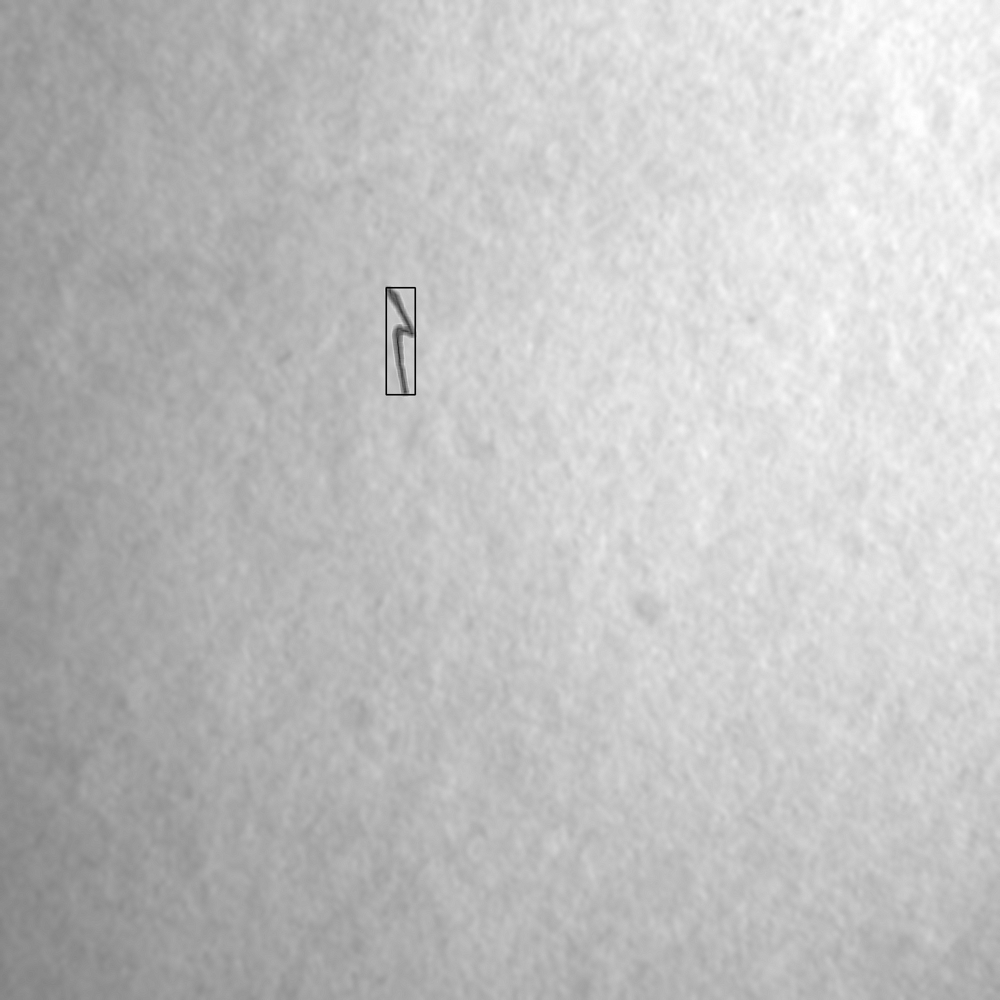

Actula Label :  Pen Mark
Predicted label :  Pen Mark
Defect Detection : 


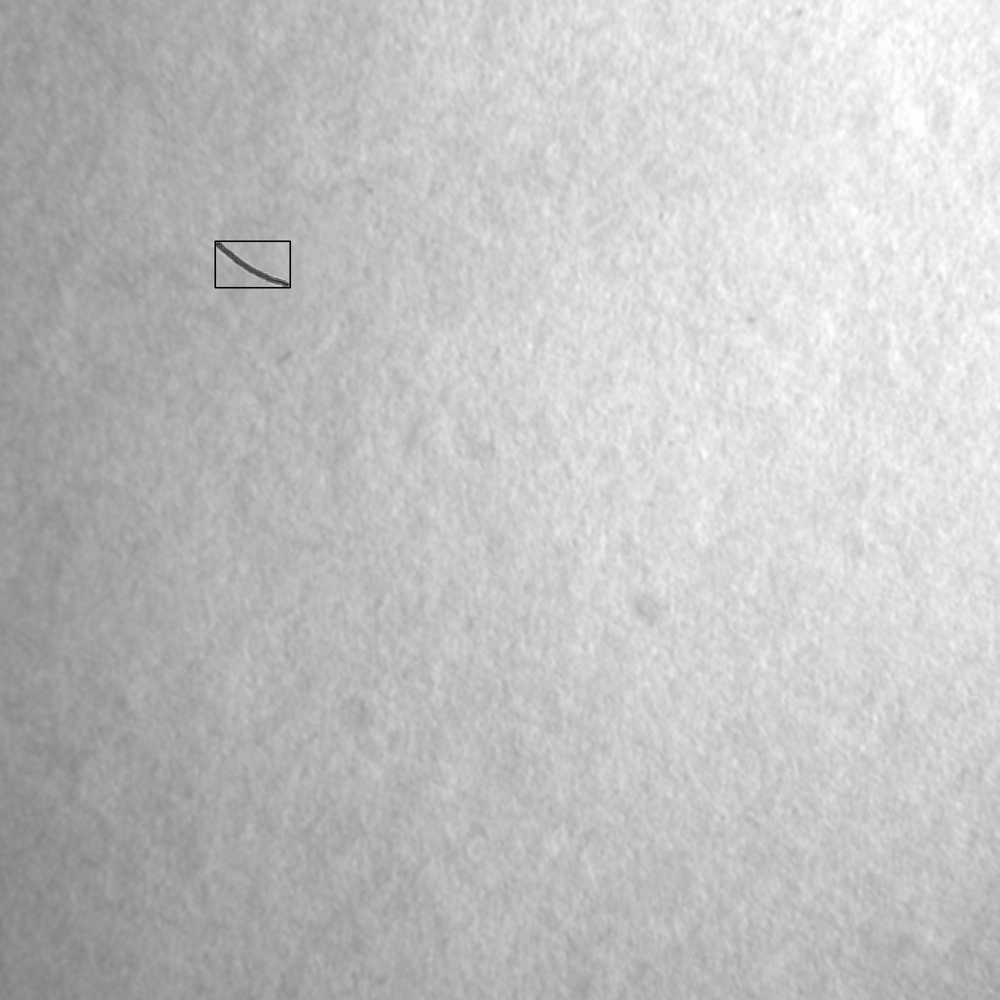

Actula Label :  Pen Mark
Predicted label :  Pen Mark
Defect Detection : 


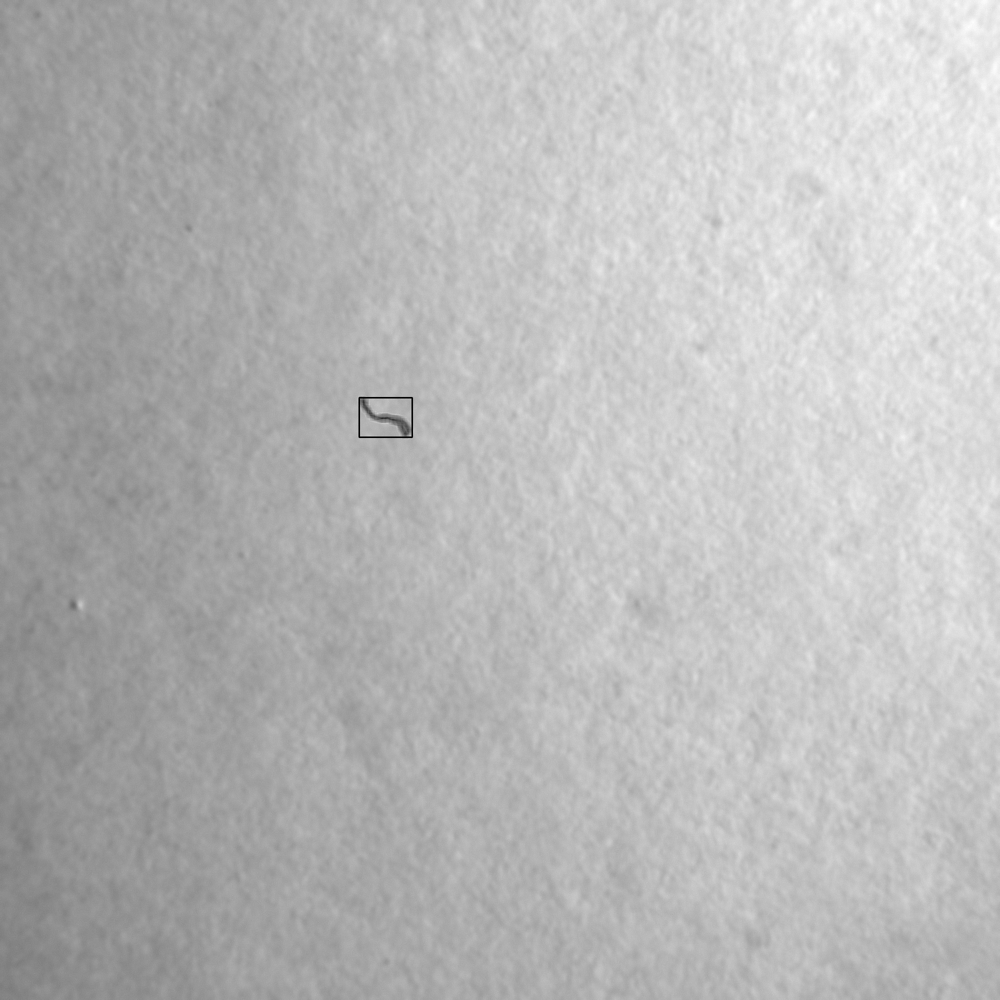

Actula Label :  Hole
Predicted label :  Hole
Defect Detection : 


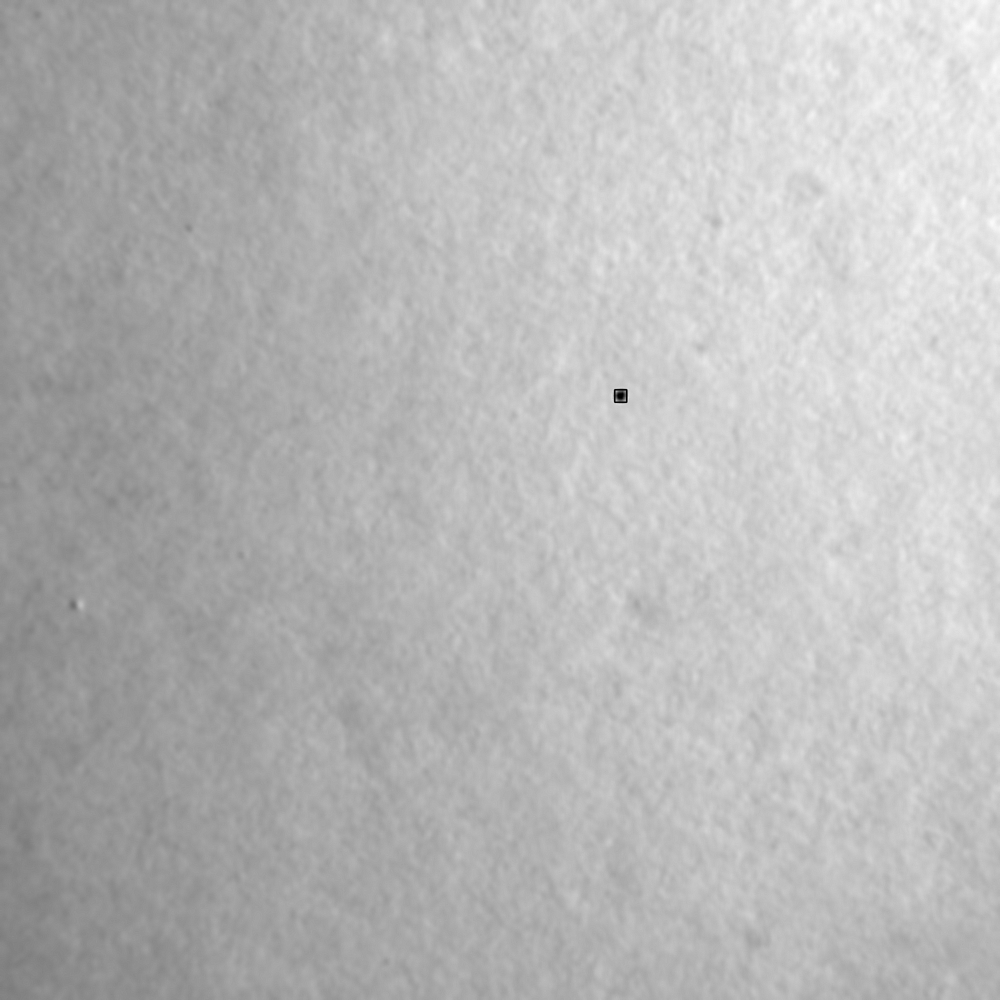

Actula Label :  Hole
Predicted label :  Hole
Defect Detection : 


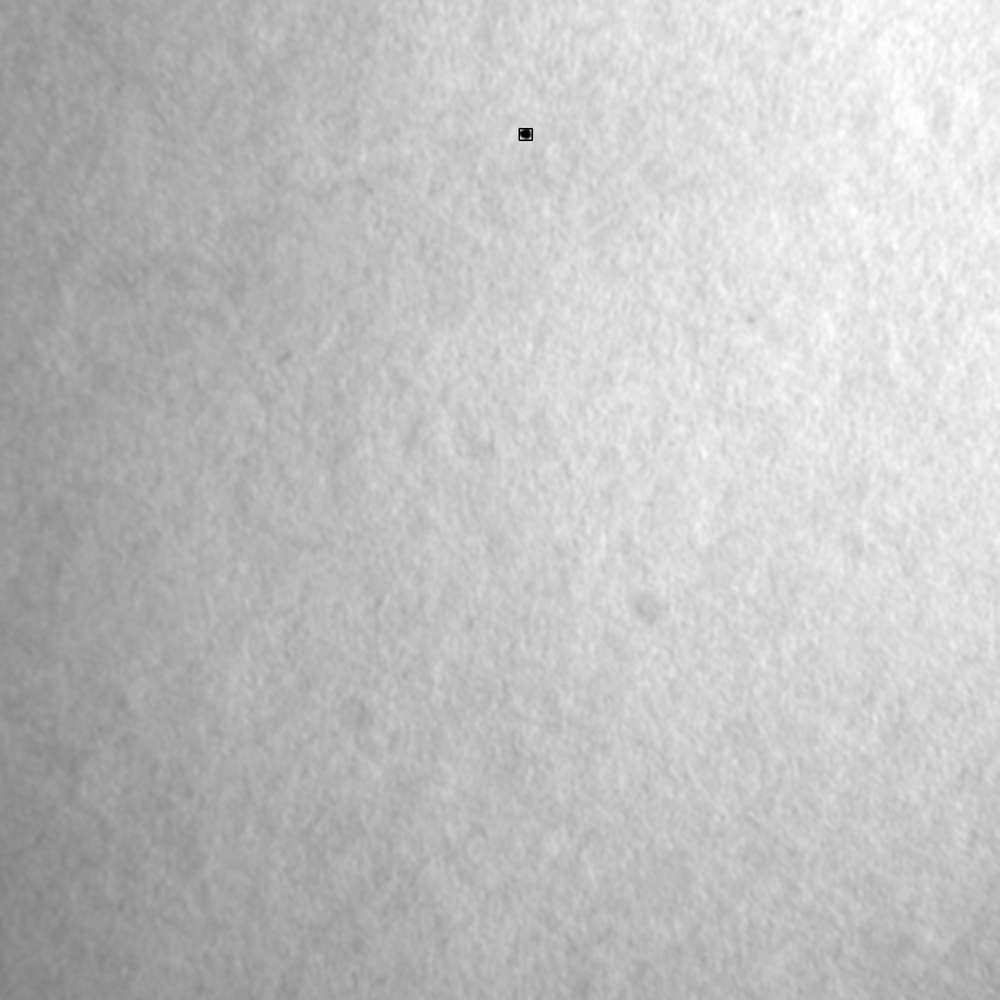

In [97]:

path = "/content/gdrive/MyDrive/ml project/Defect Detection samples /"



#first 4 are pen mark and 2 are pictures with holes in Defect Detection smaple
i=0
label=''
for filename in os.listdir(path):
    if filename.endswith(".jpg"):

        img = cv2.imread(path + filename)
        img_features = preprocessing(img)
        img_features=img_features.reshape(1,-1)
        pred_label=logreg.predict(img_features)
        if(i<4):
          print("Actula Label : ", "Pen Mark")
        else:
          print("Actula Label : ", "Hole")
        if (pred_label==[2]):
          label='Pen Mark'
        elif (pred_label==[1]):
          label='Hole'
        else:
          label='Blank'
        print("Predicted label : ", label)
        print("Defect Detection : ")
        img = cv2.imread(path + filename, cv2.IMREAD_GRAYSCALE)
        defect_detection(img)
        i=i+1